In [1]:
from trackml.dataset import load_event
import os
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats



In [2]:
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D

mpl.rcParams['figure.dpi'] = 300

In [3]:
event_prefix = 'event000001000'
hits, cells, particles, truth = load_event(os.path.join('./data/train_1/', event_prefix))
hits.describe()

,hit_id,x,y,z,volume_id,layer_id,module_id
count,120939.00000,120939.000000,120939.000000,120939.000000,120939.000000,120939.000000,120939.000000
mean,60470.00000,-1.769457,4.751043,-2.314452,10.921564,5.918389,371.969117
std,34912.22644,305.714539,305.173279,1061.935303,3.365705,3.407428,529.032206
min,1.00000,-1024.839966,-1025.109985,-2955.500000,7.000000,2.000000,1.000000
25%,30235.50000,-100.146000,-95.896503,-655.799988,8.000000,4.000000,60.000000
50%,60470.00000,-1.651340,1.005920,-1.800000,9.000000,6.000000,119.000000
75%,90704.50000,97.267651,103.224003,655.799988,13.000000,8.000000,490.000000
max,120939.00000,1025.329956,1024.849976,2955.500000,18.000000,14.000000,3192.000000


In [4]:
hits.head()

,hit_id,x,y,z,volume_id,layer_id,module_id
0,1,-64.409897,-7.163700,-1502.5,7,2,1
1,2,-55.336102,0.635342,-1502.5,7,2,1
2,3,-83.830498,-1.143010,-1502.5,7,2,1
3,4,-96.109100,-8.241030,-1502.5,7,2,1
4,5,-62.673599,-9.371200,-1502.5,7,2,1


In [5]:
hits.tail()

,hit_id,x,y,z,volume_id,layer_id,module_id
120934,120935,-763.862976,51.569401,2944.5,18,12,97
120935,120936,-808.705017,3.459260,2944.5,18,12,97
120936,120937,-982.935974,41.460899,2952.5,18,12,98
120937,120938,-942.698975,18.489100,2952.5,18,12,98
120938,120939,-922.890015,2.092850,2952.5,18,12,98


C:\Anaconda\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


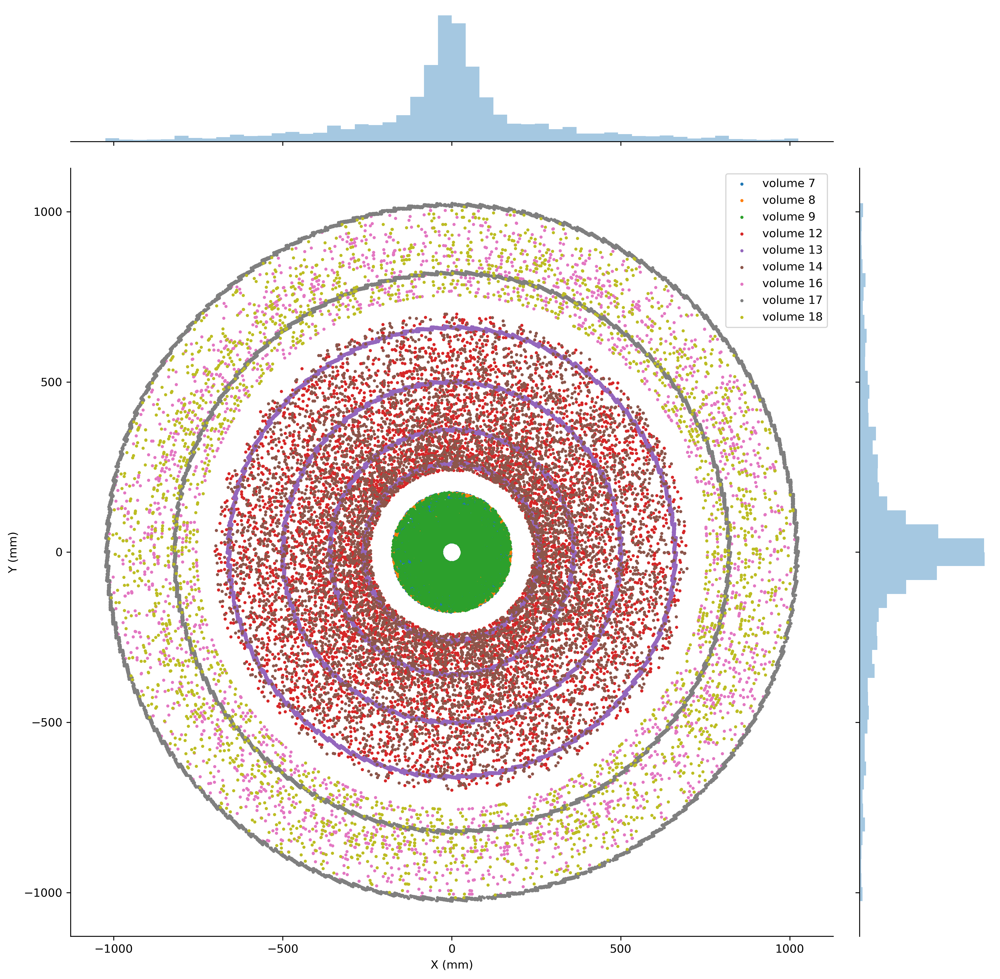

In [6]:
g = sns.jointplot(hits.x, hits.y,  s=1, height=12)
g.ax_joint.cla()
plt.sca(g.ax_joint)

volumes = hits.volume_id.unique()
for volume in volumes:
    v = hits[hits.volume_id == volume]
    plt.scatter(v.x, v.y, s=3, label='volume {}'.format(volume))

plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.legend()
plt.show()

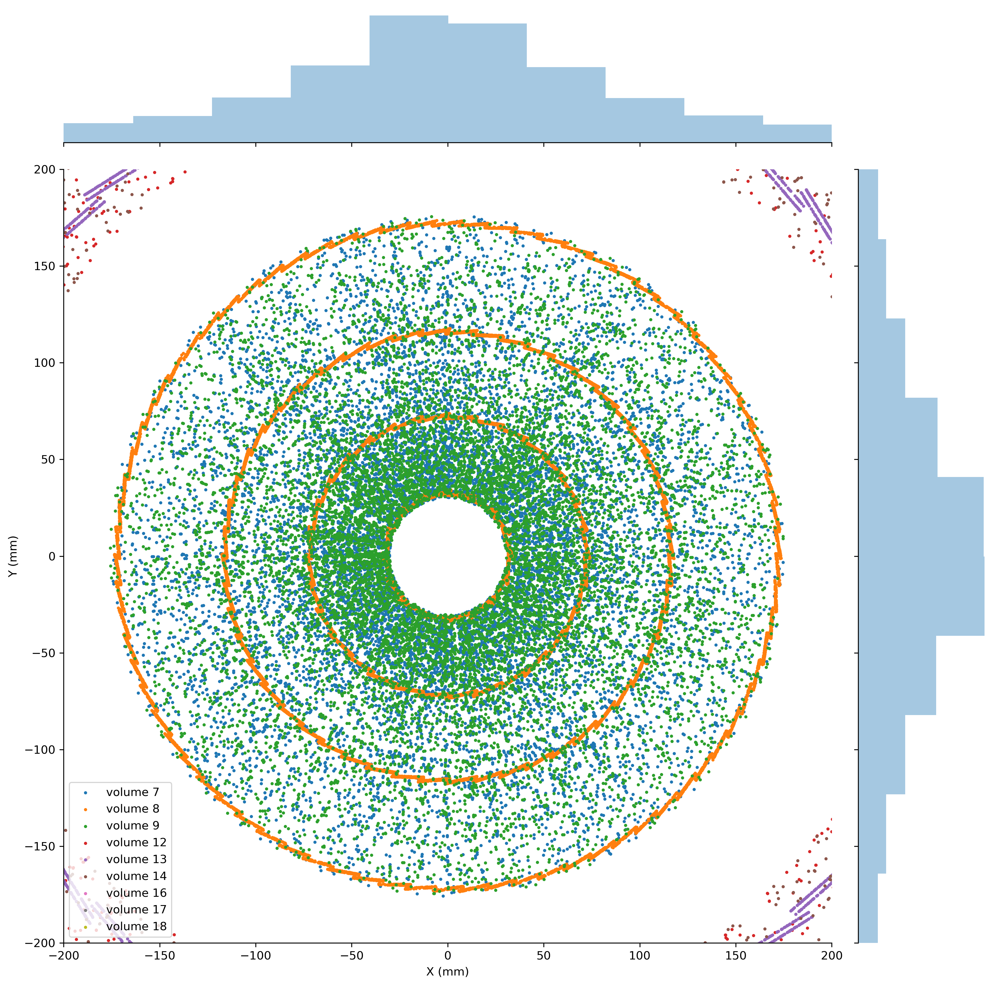

In [7]:
g = sns.jointplot(hits.x, hits.y,  s=1, height=12)
g.ax_joint.cla()
plt.sca(g.ax_joint)

volumes = hits.volume_id.unique()
for volume in volumes:
    v = hits[hits.volume_id == volume]
    plt.scatter(v.x, v.y, s=3, label='volume {}'.format(volume))

plt.xlim([-200,200])
plt.ylim([-200,200])
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.legend()
plt.show()

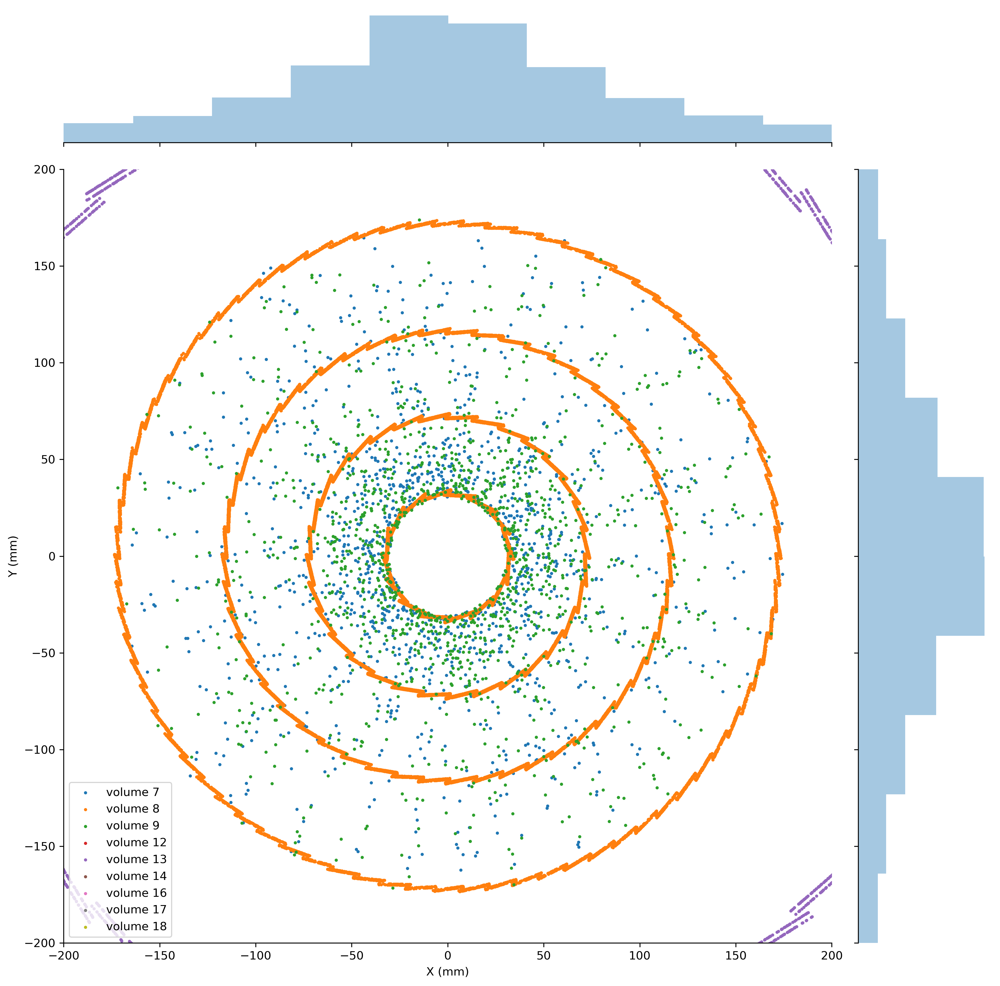

In [8]:
g = sns.jointplot(hits.x, hits.y,  s=1, height=12)
g.ax_joint.cla()
plt.sca(g.ax_joint)

volumes = hits.volume_id.unique()
for volume in volumes:
    v = hits[hits.volume_id == volume]
    plt.scatter(v[v.z.abs()<600].x, v[v.z.abs()<600].y, s=3, label='volume {}'.format(volume))

plt.xlim([-200,200])
plt.ylim([-200,200])
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')
plt.legend()
plt.show()

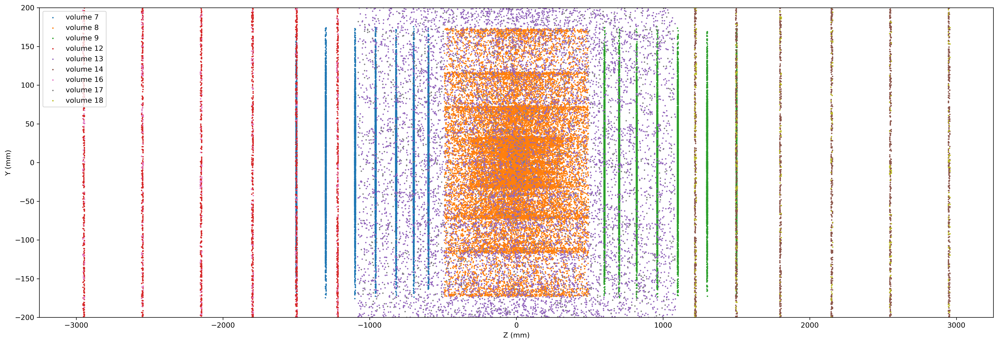

In [85]:
volumes = hits.volume_id.unique()
plt.figure(figsize=(24,8))

for volume in volumes:
    v = hits[hits.volume_id == volume]
    plt.scatter(v.z, v.y, s=1, label='volume {}'.format(volume))

plt.xlabel('Z (mm)')
plt.ylabel('Y (mm)')
plt.ylim([-200,200])
plt.legend()
plt.show()


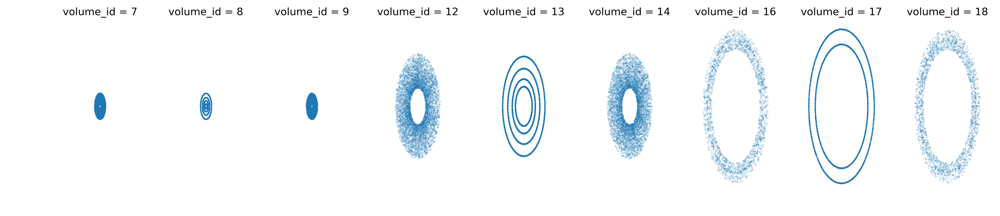

In [82]:
g = sns.FacetGrid(hits, col="volume_id",aspect=0.5,sharey=True,sharex=True)
g=(g.map(plt.scatter,"x", "y",s=0.01))
g.set_axis_labels('')
for i in range(len(hits.volume_id.unique())):
    g.facet_axis(0,i).axis('off')
plt.tight_layout()
plt.show()

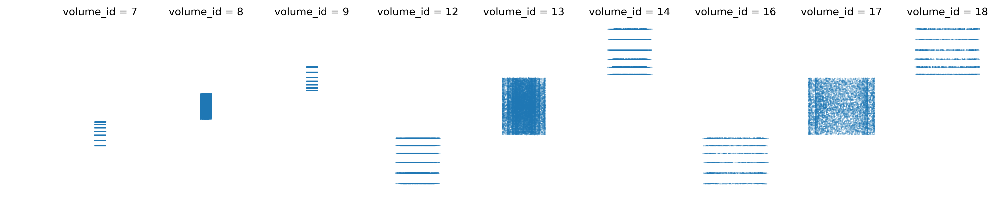

In [84]:
g = sns.FacetGrid(hits, col="volume_id",aspect=0.5,sharey=True,sharex=True)
g=(g.map(plt.scatter,"x", "z",s=0.01))
g.set_axis_labels('')
for i in range(len(hits.volume_id.unique())):
    g.facet_axis(0,i).axis('off')
plt.tight_layout()
plt.show()

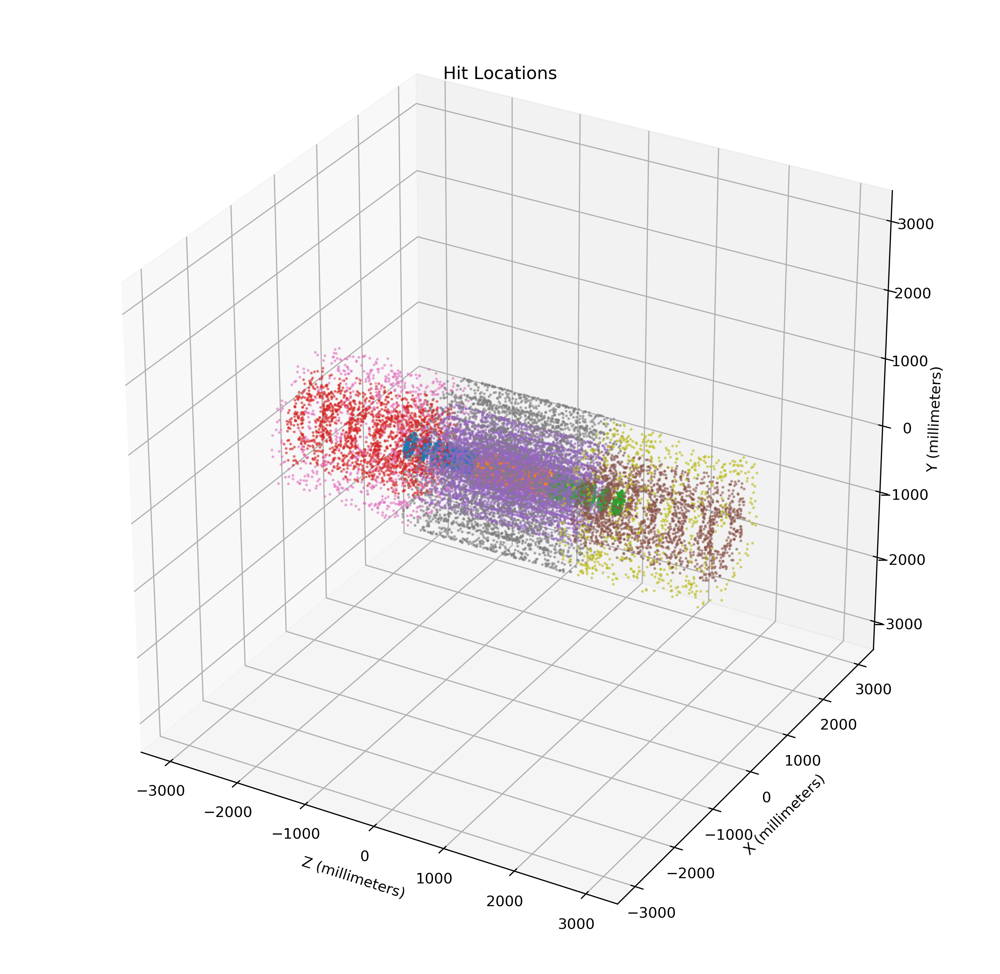

In [10]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, projection='3d')
sample = hits.sample(30000)
for volume in volumes:
    v = sample[sample.volume_id == volume]
    ax.scatter(v.z, v.x, v.y, s=1, label='volume {}'.format(volume), alpha=0.5)
ax.set_title('Hit Locations')
ax.set_xlabel('Z (millimeters)')
ax.set_ylabel('X (millimeters)')
ax.set_zlabel('Y (millimeters)')
#ax.view_init(elev=10,azim=10)
ax.scatter(3000,3000,3000, s=0)
ax.scatter(-3000,-3000,-3000, s=0)
plt.show()

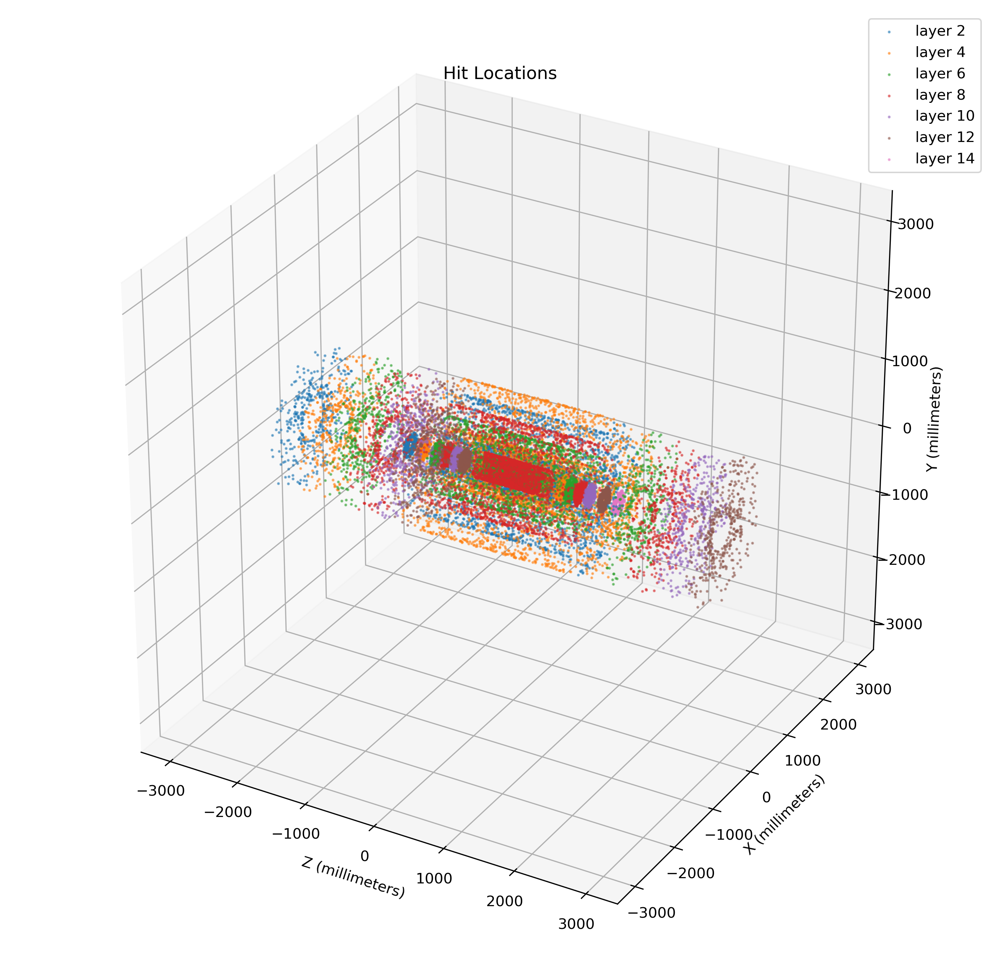

In [11]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, projection='3d')
layers = hits.layer_id.unique()

for layer in layers:
    v = sample[sample.layer_id == layer]
    ax.scatter(v.z, v.x, v.y, s=1, label='layer {}'.format(layer), alpha=0.5)
ax.set_title('Hit Locations')
ax.set_xlabel('Z (millimeters)')
ax.set_ylabel('X (millimeters)')
ax.set_zlabel('Y (millimeters)')
ax.scatter(3000,3000,3000, s=0)
ax.scatter(-3000,-3000,-3000, s=0)
ax.legend()
#ax.view_init(elev=10,azim=10)
plt.show()

In [12]:
particles.describe()

,particle_id,vx,vy,vz,px,py,pz,q,nhits
count,1.226300e+04,12263.000000,12263.000000,12263.000000,12263.000000,12263.000000,12263.000000,12263.000000,12263.000000
mean,4.803273e+17,1.107619,0.767672,7.498722,-0.003691,0.000103,0.100067,0.107233,8.424121
std,2.983347e+17,124.100189,124.626076,537.843567,0.930212,0.640032,7.765715,0.994274,5.033464
min,4.503668e+15,-955.513977,-901.664978,-2955.500000,-45.300701,-16.516300,-95.573402,-1.000000,0.000000
25%,2.161771e+17,-0.017552,-0.013040,-5.444660,-0.215898,-0.208301,-0.815998,-1.000000,4.000000
50%,4.548682e+17,0.000457,0.002574,-0.438758,-0.005679,0.006612,0.001188,1.000000,10.000000
75%,7.431018e+17,0.014919,0.013532,6.016730,0.203908,0.215444,0.848551,1.000000,12.000000
max,9.683079e+17,968.200012,980.807007,2950.000000,53.201599,11.169400,459.528015,1.000000,19.000000


In [13]:
truth.head()

,hit_id,particle_id,tx,ty,tz,tpx,tpy,tpz,weight
0,1,0,-64.411598,-7.164120,-1502.5,250710.000000,-149908.000000,-956385.00000,0.000000
1,2,22525763437723648,-55.338501,0.630805,-1502.5,-0.570605,0.028390,-15.49220,0.000010
2,3,0,-83.828003,-1.145580,-1502.5,626295.000000,-169767.000000,-760877.00000,0.000000
3,4,297237712845406208,-96.122902,-8.230360,-1502.5,-0.225235,-0.050968,-3.70232,0.000008
4,5,418835796137607168,-62.659401,-9.375040,-1502.5,-0.281806,-0.023487,-6.57318,0.000009


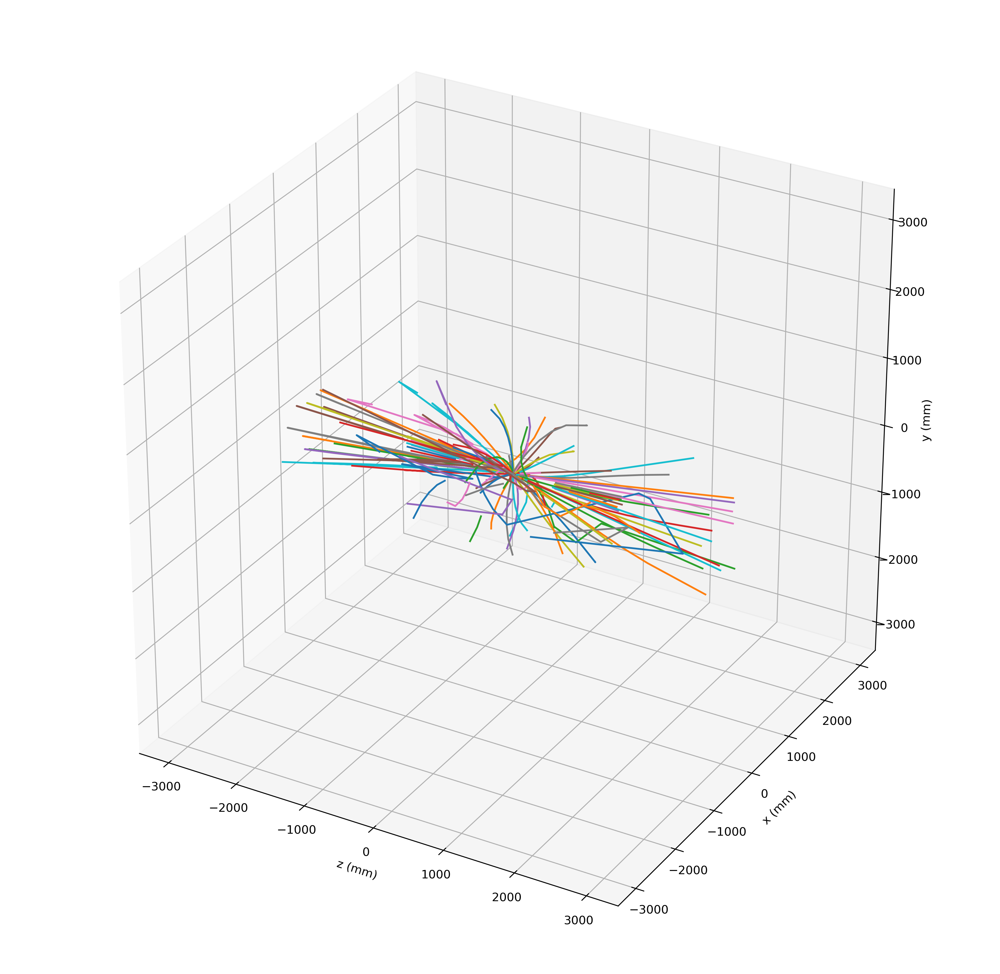

In [18]:
# Get every 100th particle
tracks = truth.particle_id.unique()[1::100]

plt.figure(figsize=(15,15))
ax = plt.axes(projection='3d')
for track in tracks:
    t = truth[truth.particle_id == track]
    ax.plot3D(t.tz, t.tx, t.ty)
ax.set_xlabel('z (mm)')
ax.set_ylabel('x (mm)')
ax.set_zlabel('y (mm)')
# These two added to widen the 3D space
ax.scatter(3000,3000,3000, s=0)
ax.scatter(-3000,-3000,-3000, s=0)
plt.show()